In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from cartopy import crs as ccrs
from cartopy import feature as cfeature
import xarray as xr
import datetime as dt

In [2]:
ct_ds = xr.open_dataset("/home11/grad/2021/gd673524/research/gdines/box_proj/CONCAN_data/rd_t/ct_rd.nc")
stdvt_ds = xr.open_dataset("/home11/grad/2021/gd673524/research/gdines/box_proj/CONCAN_data/rd_t/stdvt_rd.nc")
j_ds =  xr.open_dataset("/home11/grad/2021/gd673524/research/gdines/box_proj/CONCAN_data/rd_t/realt_jan.nc")
f_ds =  xr.open_dataset("/home11/grad/2021/gd673524/research/gdines/box_proj/CONCAN_data/rd_t/realt_feb.nc")
t_ensmn_ds = xr.open_dataset("/home11/grad/2021/gd673524/research/gdines/box_proj/CONCAN_data/ensmn_t/ECMWF_ensmn_t.nc")
t2_ensmn_ds = xr.open_dataset("/home11/grad/2021/gd673524/research/gdines/box_proj/CONCAN_data/ensmn_t/ECCC_ensmn_t.nc")
t3_ensmn_ds = xr.open_dataset("/home11/grad/2021/gd673524/research/gdines/box_proj/CONCAN_data/ensmn_t/UKMO_ensmn_t.nc")
t4_ensmn_ds = xr.open_dataset("/home11/grad/2021/gd673524/research/gdines/box_proj/CONCAN_data/ensmn_t/CMA_ensmn_t.nc")
t5_ensmn_ds = xr.open_dataset("/home11/grad/2021/gd673524/research/gdines/box_proj/CONCAN_data/ensmn_t/JMA_ensmn_t.nc")
t6_ensmn_ds = xr.open_dataset("/home11/grad/2021/gd673524/research/gdines/box_proj/CONCAN_data/ensmn_t/CNR_ensmn_t.nc")

In [3]:
rt_ds = xr.concat([j_ds,f_ds], dim='time')

In [4]:
ct_ds = ct_ds.rename({'lon': 'longitude','lat': 'latitude'})
rt_ds = rt_ds.rename({'lon': 'longitude','lat': 'latitude'})
stdvt_ds = stdvt_ds.rename({'lon': 'longitude','lat': 'latitude'})

In [5]:
#Creating variables for the step and date of forecast
step = t_ensmn_ds.step["step.days"] #<-- days forecasted out (47)
fd = t_ensmn_ds.date["date.dayofyear"] #<--day of forecast(8)
step2 = t2_ensmn_ds.step["step.days"] #<-- days forecasted out (32)
fd2 = t2_ensmn_ds.date["date.dayofyear"] #<--day of forecast(4)
step3 = t3_ensmn_ds.step["step.days"] 
fd3 = t3_ensmn_ds.date["date.dayofyear"]
step4 = t4_ensmn_ds.step["step.days"] 
fd4 = t4_ensmn_ds.date["date.dayofyear"]
step5 = t5_ensmn_ds.step["step.days"] 
fd5 = t5_ensmn_ds.date["date.dayofyear"]
step6 = t6_ensmn_ds.step["step.days"]
fd6 = t6_ensmn_ds.date["date.dayofyear"]

#Creating time and lat/lon variables
time = ct_ds['time']
rt_time = rt_ds.time['time.dayofyear']
latitude = ct_ds['latitude']
longitude = ct_ds['longitude']

#Creating data array of forecast day and step in Day of Year
doy1 = fd + step
doy2 = fd2 + step2
doy3 = fd3 + step3
doy4 = fd4 + step4
doy5 = fd5 + step5
doy6 = fd6 + step6

In [6]:
#Giving climo data forecast days and steps
ct1_match = ct_ds.sel(time=doy1)
ct2_match = ct_ds.sel(time=doy2)
ct3_match = ct_ds.sel(time=doy3)
ct4_match = ct_ds.sel(time=doy4)
ct5_match = ct_ds.sel(time=doy5)
ct6_match = ct_ds.sel(time=doy6)
ct_rt_match = ct_ds.sel(time= rt_time)
stdvt_match = stdvt_ds.sel(time=rt_time)

In [7]:
#Calculating Mean Area Temp Anoms
anom_t = t_ensmn_ds.t - ct1_match
anom_t2 = t2_ensmn_ds.t - ct2_match
anom_t3 = t3_ensmn_ds.t - ct3_match
anom_t4 = t4_ensmn_ds.t - ct4_match
anom_t5 = t5_ensmn_ds.t - ct5_match
anom_t6 = t6_ensmn_ds.t - ct6_match
anom_rt = rt_ds.t.values - ct_rt_match.t.values

In [8]:
anom_rt_ds = xr.Dataset(
    data_vars=dict(
        temperature_anom=(['time','latitude',"longitude"], anom_rt),
    ),
    coords=dict(
        time=rt_time,
        latitude=(["latitude"], latitude.data),
        longitude=(["longitude"], longitude.data),      
    ),
    attrs=dict(description="Actual Temp Anomalies (K)"),
)
#Need to get this into a data set so I can use dataset.assign

In [9]:
stdvt_match

<xarray.Dataset>
Dimensions:    (time: 59, longitude: 67, latitude: 34)
Coordinates:
  * time       (time) float64 1.0 2.0 3.0 4.0 5.0 ... 55.0 56.0 57.0 58.0 59.0
  * longitude  (longitude) float64 201.0 202.5 204.0 205.5 ... 297.0 298.5 300.0
  * latitude   (latitude) float64 75.0 73.5 72.0 70.5 ... 30.0 28.5 27.0 25.5
    hour       float64 ...
    lev        int32 ...
    level      int32 1000
Data variables:
    t          (time, latitude, longitude) float64 ...

In [10]:
test_anom_rt_ds = xr.merge([anom_rt_ds, stdvt_match]).drop(['hour', 'level', 'lev'])

In [11]:
test_anom_rt_ds

<xarray.Dataset>
Dimensions:           (time: 59, latitude: 34, longitude: 67)
Coordinates:
  * time              (time) int64 1 2 3 4 5 6 7 8 9 ... 52 53 54 55 56 57 58 59
  * latitude          (latitude) float64 75.0 73.5 72.0 70.5 ... 28.5 27.0 25.5
  * longitude         (longitude) float64 201.0 202.5 204.0 ... 298.5 300.0
Data variables:
    temperature_anom  (time, latitude, longitude) float64 -0.4275 ... -0.5876
    t                 (time, latitude, longitude) float64 ...
Attributes:
    description:  Actual Temp Anomalies (K)

In [12]:
stdvt_match.t.isel(time=1)

<xarray.DataArray 't' (latitude: 34, longitude: 67)>
array([[5.66572 , 5.643042, 5.63321 , ..., 6.867344, 7.092618, 7.196642],
       [5.991998, 5.988392, 5.996586, ..., 6.759195, 7.19108 , 7.605042],
       [6.476804, 6.485331, 6.491366, ..., 6.69715 , 7.23977 , 7.756878],
       ...,
       [2.257635, 2.233476, 2.201549, ..., 1.881171, 1.828186, 1.801894],
       [2.064817, 2.025945, 1.989192, ..., 1.666326, 1.624593, 1.597824],
       [1.824041, 1.791821, 1.72391 , ..., 1.455579, 1.410259, 1.374656]])
Coordinates:
    time       float64 2.0
  * longitude  (longitude) float64 201.0 202.5 204.0 205.5 ... 297.0 298.5 300.0
  * latitude   (latitude) float64 75.0 73.5 72.0 70.5 ... 30.0 28.5 27.0 25.5
    hour       float64 0.0
    lev        int32 1000
    level      int32 1000

In [13]:
cLon = -95
cLat = 35

proj_map = ccrs.LambertConformal(central_longitude=cLon, central_latitude=cLat)
proj_data = ccrs.PlateCarree() # Our data is lat-lon; thus its native projection is Plate Carree.
res = '50m'
lonW,lonE,latS,latN = 290, 230, 22, 73

In [14]:
stdvt_match

<xarray.Dataset>
Dimensions:    (time: 59, longitude: 67, latitude: 34)
Coordinates:
  * time       (time) float64 1.0 2.0 3.0 4.0 5.0 ... 55.0 56.0 57.0 58.0 59.0
  * longitude  (longitude) float64 201.0 202.5 204.0 205.5 ... 297.0 298.5 300.0
  * latitude   (latitude) float64 75.0 73.5 72.0 70.5 ... 30.0 28.5 27.0 25.5
    hour       float64 0.0
    lev        int32 1000
    level      int32 1000
Data variables:
    t          (time, latitude, longitude) float64 ...

/tmp/ipykernel_74954/739831848.py:3: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig = plt.figure(figsize=(18,12))


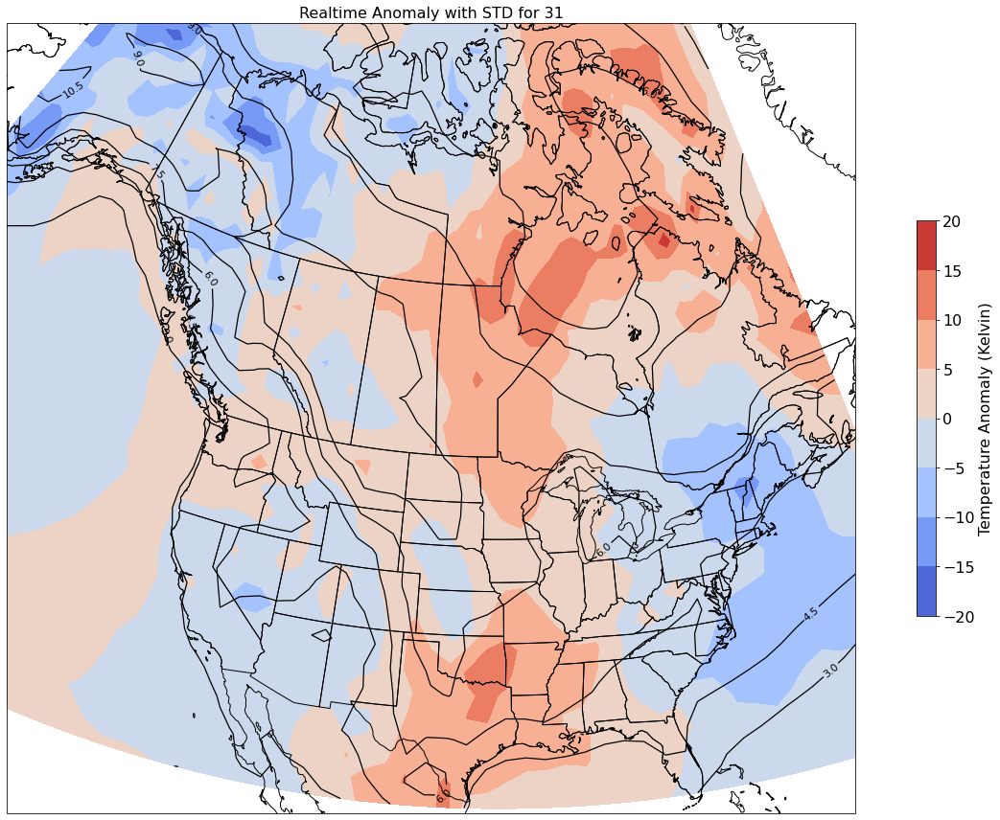

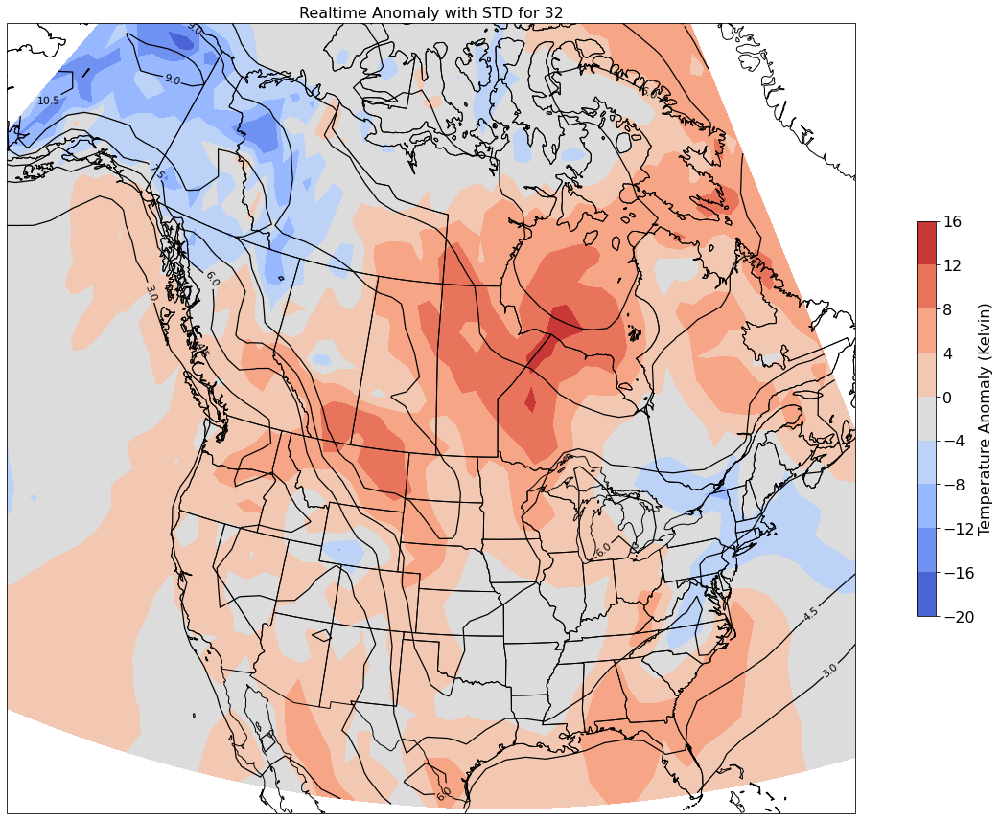

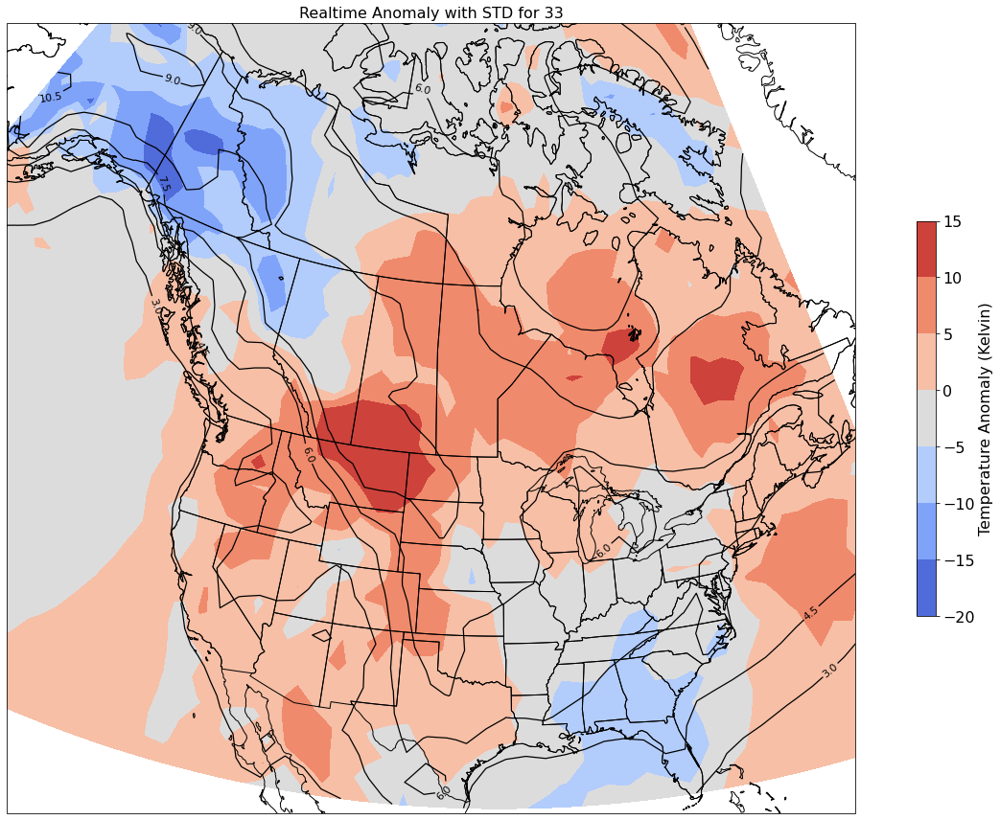

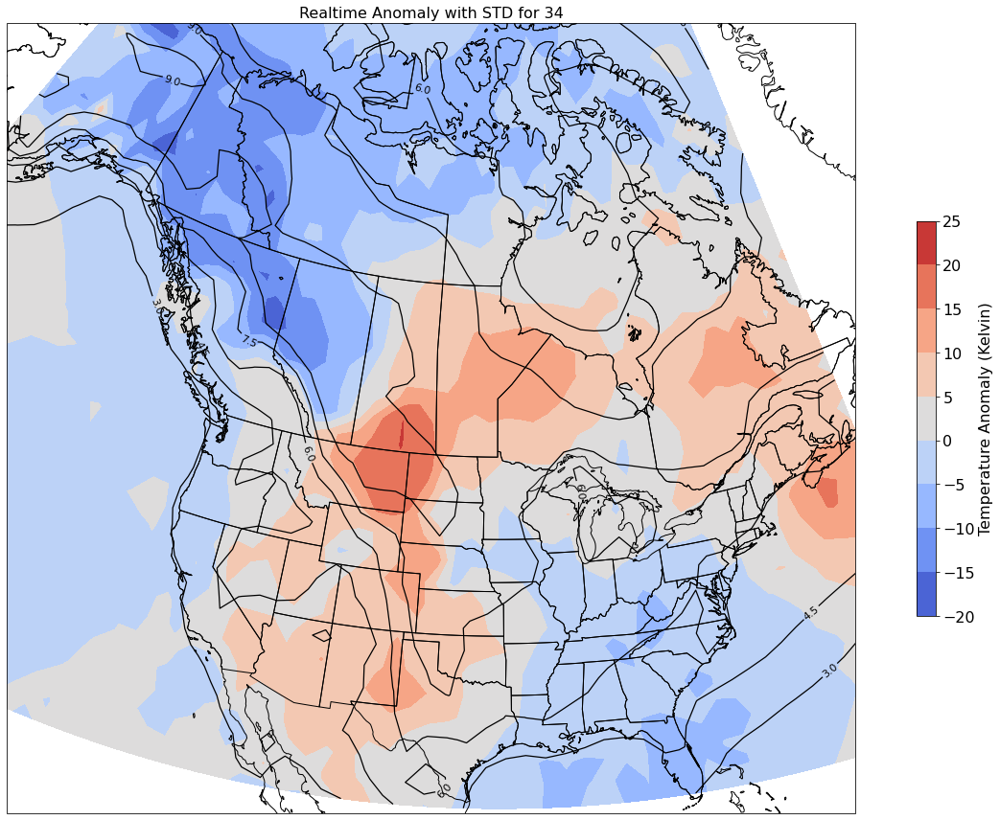

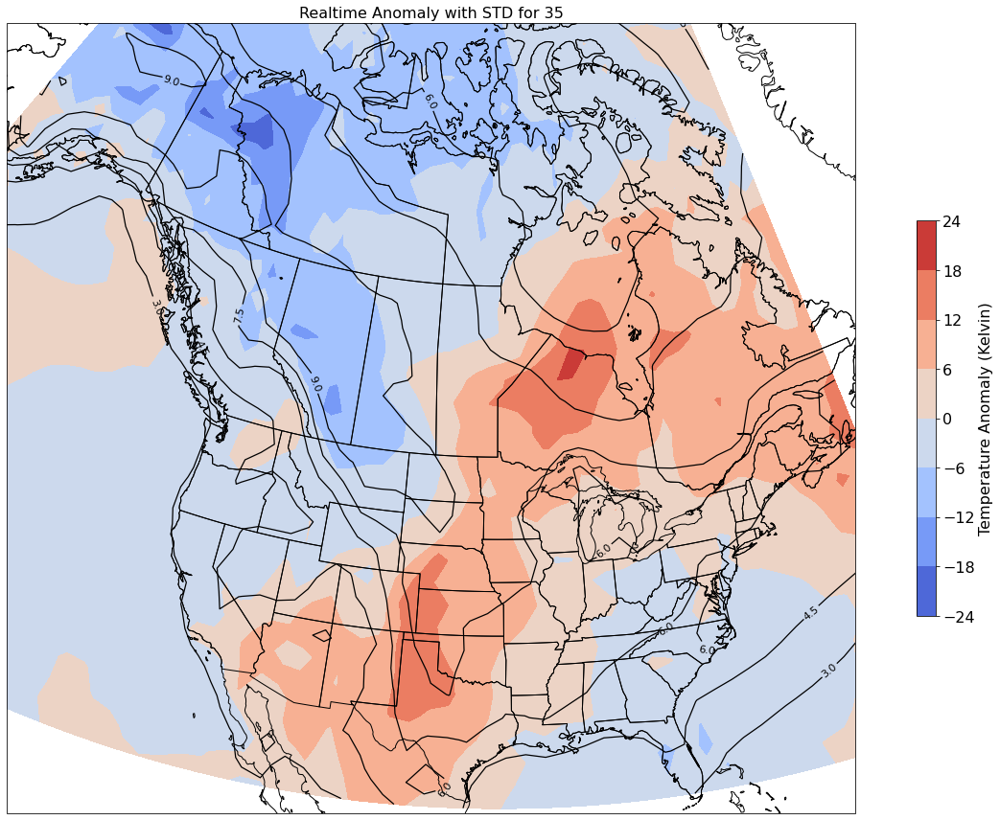

...

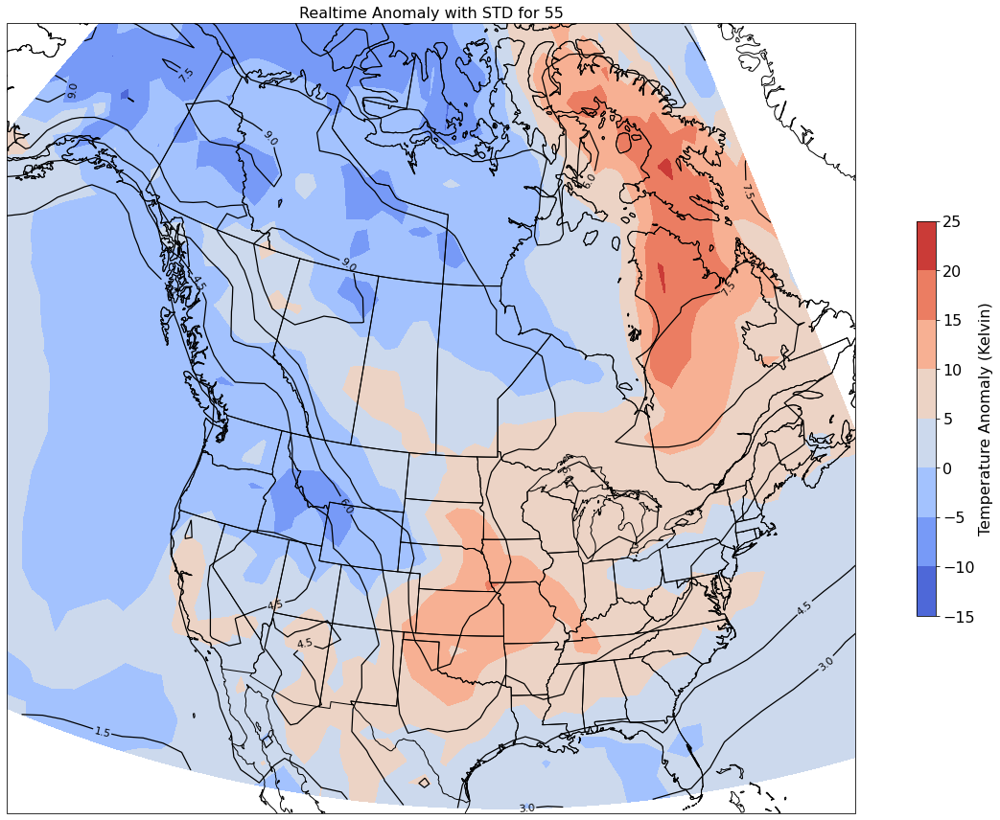

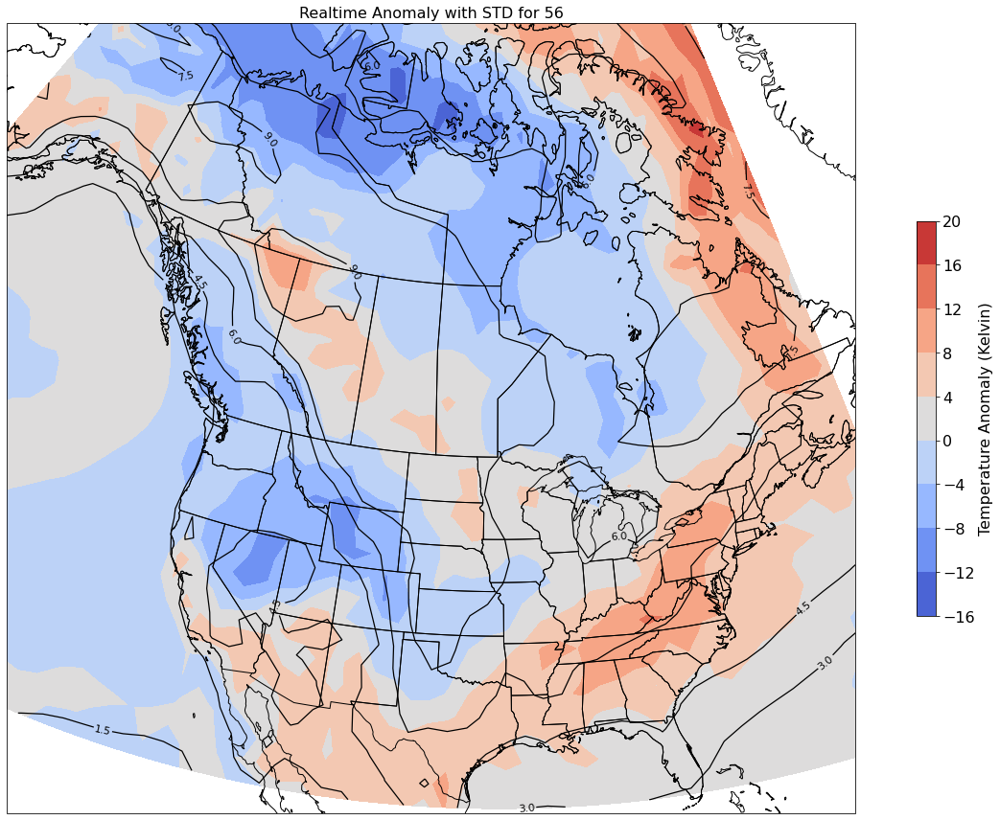

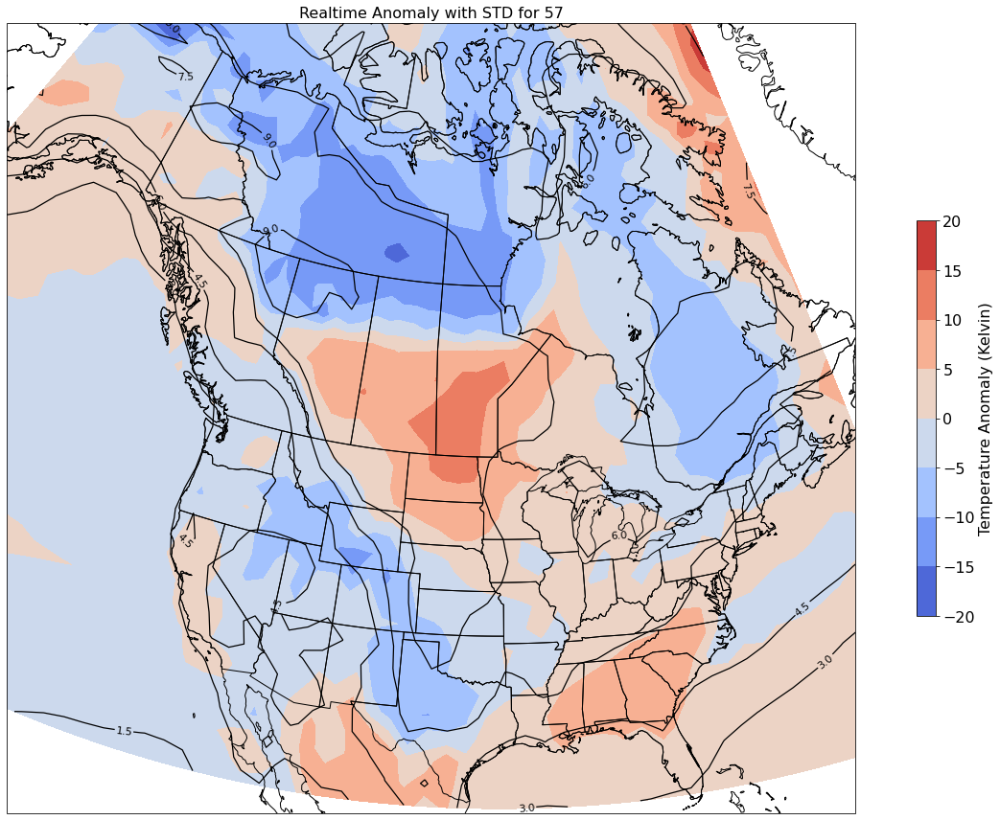

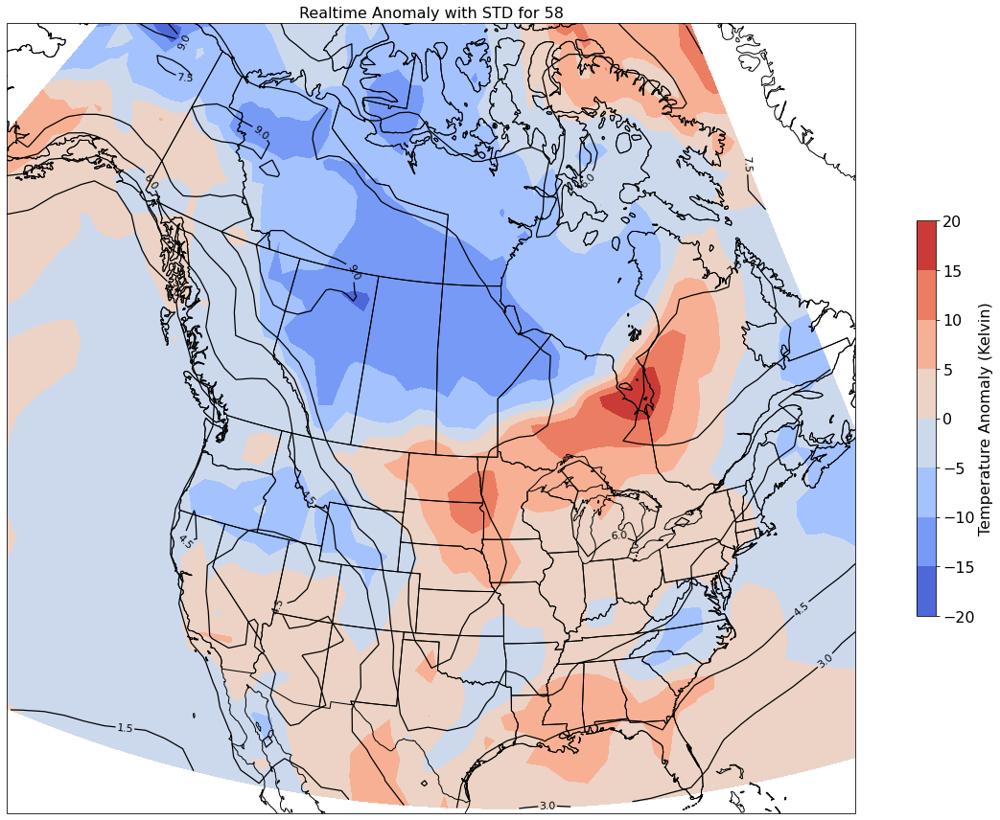

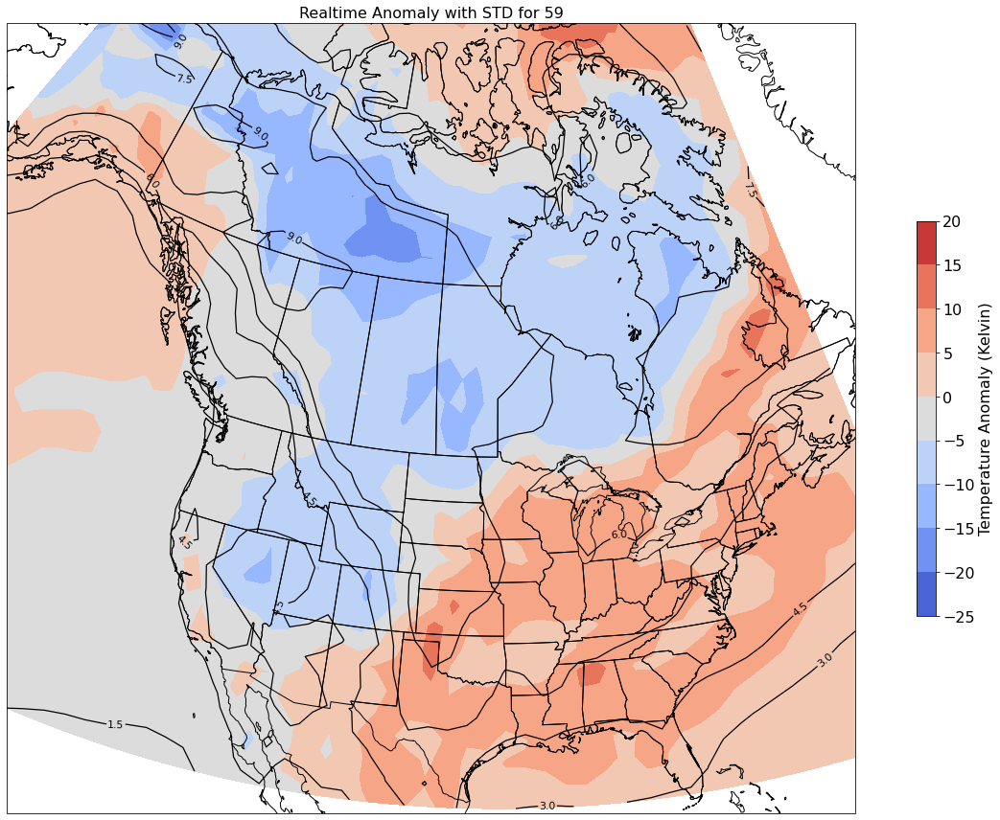

In [17]:
#Plotting Real Anomalies with climo standard deviation (Era-5 data plotted)
for m in range(30,59,1):
    fig = plt.figure(figsize=(18,12))
    ax = plt.subplot(1,1,1,projection=proj_map)
    ax.set_extent ([lonW,lonE,latS,latN])
    ax.add_feature(cfeature.COASTLINE.with_scale(res))
    ax.add_feature(cfeature.STATES.with_scale(res))
    CF = ax.contourf(anom_rt_ds.longitude,anom_rt_ds.latitude,anom_rt_ds.temperature_anom.isel(time=m),transform=proj_data,cmap=plt.get_cmap('coolwarm'))
    cbar = plt.colorbar(CF,shrink=0.5)
    cbar.ax.tick_params(labelsize=16)
    cbar.ax.set_ylabel("Temperature Anomaly (Kelvin)",fontsize=16)

    CL = ax.contour(anom_rt_ds.longitude,anom_rt_ds.latitude,stdvt_match.t.isel(time=m),transform=proj_data,linewidths=1.25,colors='black')
    ax.clabel(CL, inline_spacing=0.2, fontsize=11)
    title = plt.title(f"Realtime Anomaly with STD for {anom_rt_ds.time.isel(time=m).values}",fontsize=16)
    fig.tight_layout()

### Need to figure out how I want to plot the model data with the different steps. I think I want to create something similar to how xarray plots (for each date have a group of tiny plots showing all of the steps).

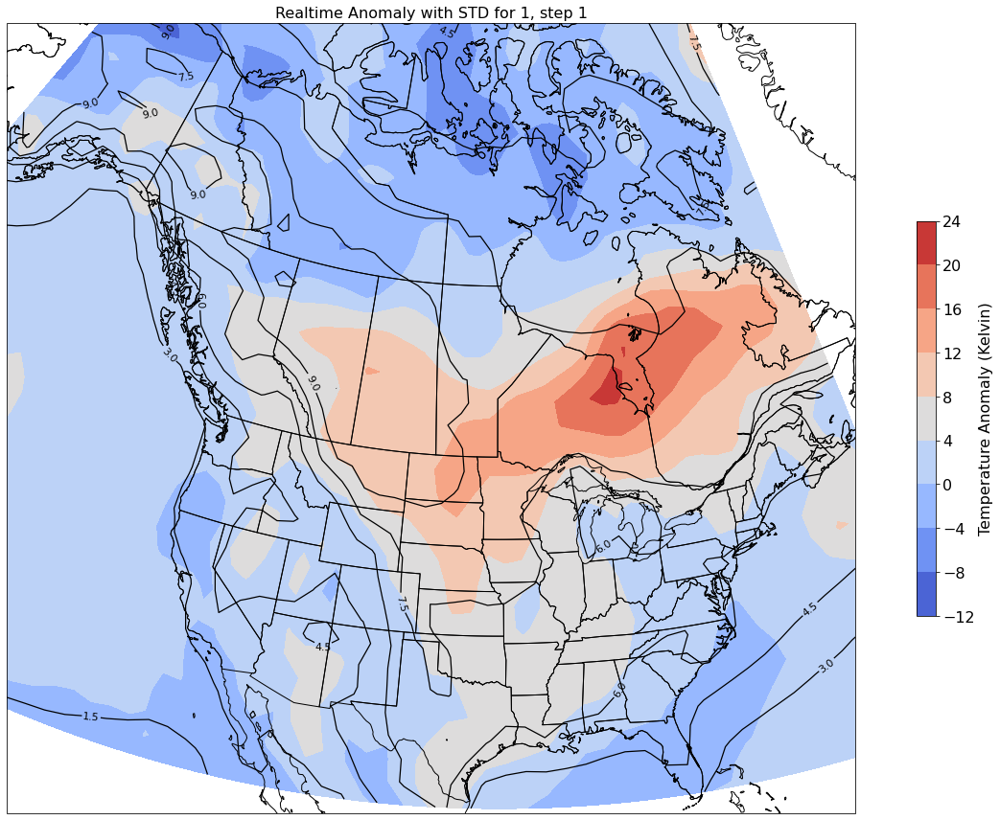

In [19]:
#Plotting ECMWF with Climo Standard Deviation
for m in range(0,1,1):
    fig = plt.figure(figsize=(18,12))
    ax = plt.subplot(1,1,1,projection=proj_map)
    ax.set_extent ([lonW,lonE,latS,latN])
    ax.add_feature(cfeature.COASTLINE.with_scale(res))
    ax.add_feature(cfeature.STATES.with_scale(res))
    CF = ax.contourf(anom_rt_ds.longitude,anom_rt_ds.latitude,anom_t.t.isel(date=m, step=1),transform=proj_data,cmap=plt.get_cmap('coolwarm'))
    cbar = plt.colorbar(CF,shrink=0.5)
    cbar.ax.tick_params(labelsize=16)
    cbar.ax.set_ylabel("Temperature Anomaly (Kelvin)",fontsize=16)

    CL = ax.contour(anom_rt_ds.longitude,anom_rt_ds.latitude,stdvt_match.t.isel(time=m),transform=proj_data,linewidths=1.25,colors='black')
    ax.clabel(CL, inline_spacing=0.2, fontsize=11)
    title = plt.title(f"Realtime Anomaly with STD for {test_anom_rt_ds.time.isel(time=m).values}, step 1",fontsize=16)
    fig.tight_layout()

In [20]:
#Repeated Variables for Plotting
bx_ext = [285, 235, 23, 73]
subplots_kws = {"projection": ccrs.Orthographic(-100, 35)}
cbar_kwargs = {'shrink':0.8, 'label':'Temperature Anomalies (K)'}

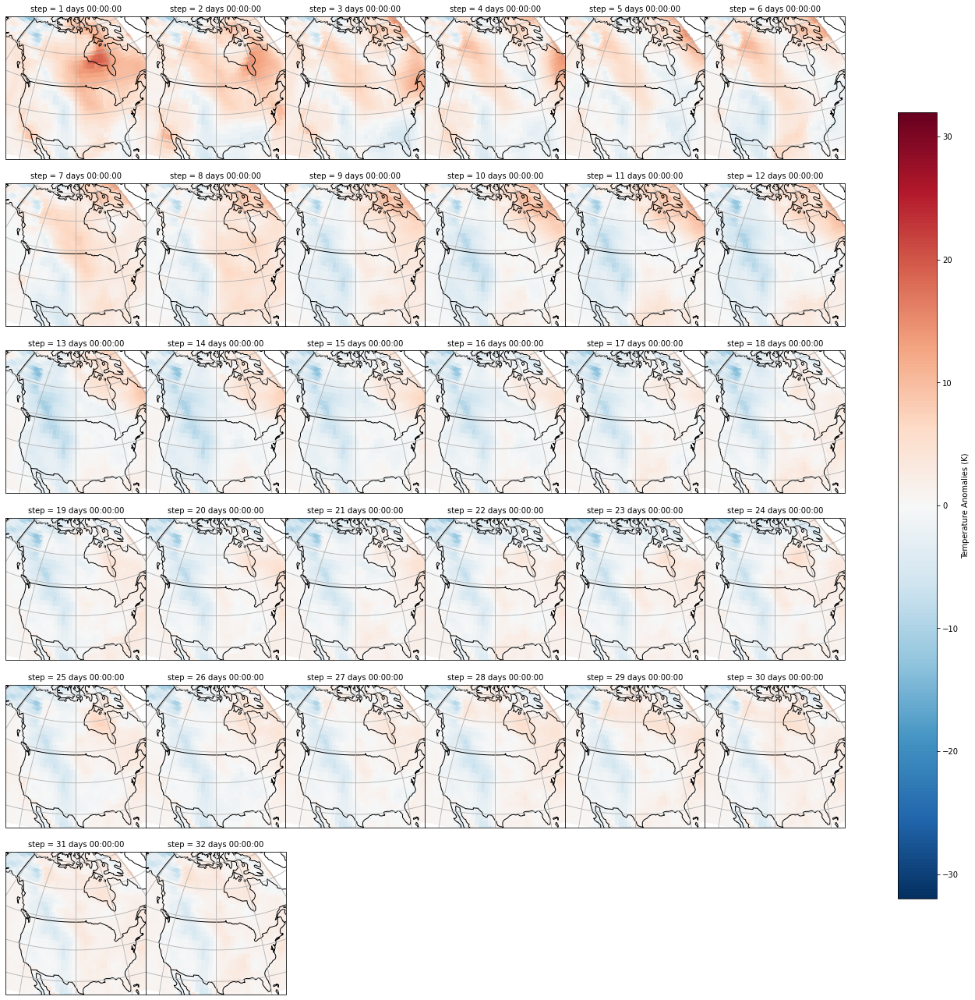

In [21]:
####THIS IS A TEST!!!
test =  anom_t2.isel(date=1)
step2 = anom_t2.date[1]+anom_t2.step[:]
p = test.t.plot(x="longitude", y="latitude", col='step', col_wrap=6, cmap='RdBu_r',transform=ccrs.PlateCarree(),
                subplot_kws=subplots_kws, cbar_kwargs=cbar_kwargs, vmin=-32, vmax=32)

for ax in p.axes.flat:
    ax.set_extent(bx_ext)
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS.with_scale(res))
    ax.gridlines()

In [ ]:
####TEST2!!!!!!
for m in range(0,1,1): #<--Iterating over each initialization date
    plt.rc('font', size=12)
    date1 = dt.datetime(2021,1,fd[m],0) #<--Creating the date for the title
    datetoplot = date1.strftime('%Y-%m-%d')
    
    t_toplot =  anom_t.isel(date=m).sel(step = anom_t.date[m]+anom_t.step)
    p = t_toplot.t.plot(x="longitude", y="latitude", col= 'step', col_wrap=7, cmap='RdBu_r', vmin=-20, vmax=20,
                        transform=ccrs.PlateCarree(), subplot_kws={"projection": ccrs.Orthographic(-95, 35)},
                        cbar_kwargs=cbar_kwargs)
    plt.suptitle(f'ECMWF S2S Temperature Anomlies (K) {datetoplot}', size=20, y=1)
    
    for ax in p.axes.flat: #<--Adding all of the features to each map
        ax.set_extent(bx_ext)
        ax.coastlines()
        ax.add_feature(cfeature.BORDERS.with_scale(res))
        ax.gridlines()

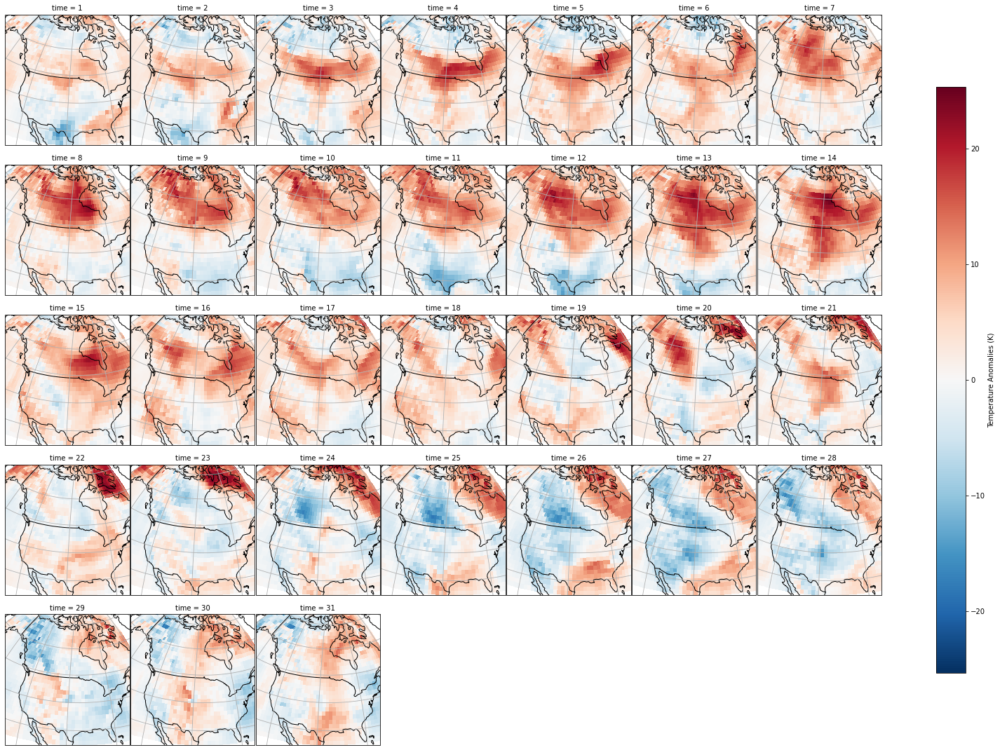

In [24]:
#This is plotting the ERA5 Temp Anomalies
rt_anom_plots = anom_rt_ds.temperature_anom[:31].plot(x="longitude", y="latitude", col="time", col_wrap=7, cmap='RdBu_r', transform=ccrs.PlateCarree(),
                subplot_kws={"projection": ccrs.Orthographic(-95, 35)}, cbar_kwargs=cbar_kwargs)
#plt.suptitle('February 2021 ERA5 1000mb Temperature Anomalies', size=20, y=1.025)

for ax in rt_anom_plots.axes.flat:
    ax.set_extent(bx_ext)
    ax.coastlines()
    ax.add_feature(cfeature.BORDERS.with_scale(res))
    ax.gridlines()
    ax.set_ylabel('latitude')
    ax.set_xlabel('longitude')
plt.savefig("January_2021_ERA5_temp_anom_1000hpa.jpg")
#    ax.contour(anom_rt_ds.longitude,anom_rt_ds.latitude,stdvt_match_plt.t.isel(time = rt_anom_plots.axes.flat),transform=proj_data,linewidths=1.25,colors='black')
#    ax.clabel(CL, inline_spacing=0.2, fontsize=11)

In [ ]:
#Plotting CONUS Map of ECMWF Temp Anomalies for each Initialization and Step
for m in range(0,8,1): #<--Iterating over each initialization date
    plt.rc('font', size=12)
    date1 = dt.datetime(2021,1,fd[m],0) #<--Creating the date for the title
    datetoplot = date1.strftime('%Y-%m-%d')
    
    t_toplot =  anom_t.isel(date=m) 
    p = t_toplot.t.plot(x="longitude", y="latitude", col="step", col_wrap=7, cmap='RdBu_r', vmin=-20, vmax=20,
                        transform=ccrs.PlateCarree(), subplot_kws={"projection": ccrs.Orthographic(-95, 35)},
                        cbar_kwargs=cbar_kwargs)
    plt.suptitle(f'ECMWF S2S Temperature Anomlies (K) {datetoplot}', size=20, y=1.1)
    
    for ax in p.axes.flat: #<--Adding all of the features to each map
        ax.set_extent(bx_ext)
        ax.coastlines()
        ax.add_feature(cfeature.BORDERS.with_scale(res))
        ax.gridlines()

In [ ]:
for m in range(0,4,1):
    plt.rc('font', size=12)
    date1 = dt.datetime(2021,1,fd[m],0)
    datetoplot = date1.strftime('%Y-%m-%d')
    
    t_toplot =  anom_t2.isel(date=m)
    p = t_toplot.t.plot(x="longitude", y="latitude", col="step", col_wrap=7, cmap='RdBu_r', vmin=-20, vmax=20,
                        transform=ccrs.PlateCarree(), subplot_kws={"projection": ccrs.Orthographic(-95, 35)},
                        cbar_kwargs=cbar_kwargs)
    plt.suptitle(f'ECCC S2S Temperature Anomlies (K) {datetoplot}', size=20, y=1)
    
    for ax in p.axes.flat:
        ax.set_extent(bx_ext)
        ax.coastlines()
        ax.add_feature(cfeature.BORDERS.with_scale(res))
        ax.gridlines()

In [ ]:
time = t_ensmn_ds.date + t_ensmn_ds.step
time_ds = time.to_dataset
time

In [ ]:
ds_merged = xr.merge([t_ensmn_ds, time_ds])

In [ ]:
t_ensmn_ds

In [ ]:
for m in range(0,8,1):
    plt.rc('font', size=12)
    t_toplot =  t_cel.isel(date=m)
    t_toplot.t.plot(x="longitude", y="latitude", col="step", col_wrap=10, cmap='RdBu_r')
    plt.title('ECMWF Temperatures(C)')
    
for m in range(0,4,1):
    plt.rc('font', size=12)
    t_toplot =  t2_cel.isel(date=m)
    t_toplot.t.plot(x="longitude", y="latitude", col="step", col_wrap=10, cmap='RdBu_r')
    plt.title('ECCC Temperatures(C)')
    
for m in range(0,31,5):
    plt.rc('font', size=12)
    t_toplot =  t3_cel.isel(date=m)
    t_toplot.t.plot(x="longitude", y="latitude", col="step", col_wrap=10, cmap='RdBu_r')
    plt.title('UKMO Temperatures(C)')
    
for m in range(0,8,1):
    plt.rc('font', size=12)
    t_toplot =  t4_cel.isel(date=m)
    t_toplot.t.plot(x="longitude", y="latitude", col="step", col_wrap=10, cmap='RdBu_r')
    plt.title('CMA Temperatures(C)')
    
for m in range(0,4,1):
    plt.rc('font', size=12)
    t_toplot =  t5_cel.isel(date=m)
    t_toplot.t.plot(x="longitude", y="latitude", col="step", col_wrap=10, cmap='RdBu_r')
    plt.title('JMA Temperatures(C)')

for m in range(0,4,1):
    plt.rc('font', size=12)
    t_toplot =  t6_cel.isel(date=m)
    t_toplot.t.plot(x="longitude", y="latitude", col="step", col_wrap=10, cmap='RdBu_r')
    plt.title('CNR Temperatures(C)')